## Profile versus Frontal Face circuits

#### load dependencies

In [4]:
#general
import torch
import os
from copy import deepcopy


#Pruner
from circuit_pruner.force import *
from circuit_pruner.utils import load_config


#dataloader
import torch.utils.data as data
import torchvision.datasets as datasets
from circuit_pruner.data_loading import rank_image_data, single_image_data
from circuit_pruner.dissected_Conv2d import *


In [5]:
#config, load a configuration file

config = load_config('/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/configs/alexnet_sparse_config.py')


#### parameters

In [3]:
device = 'cuda:1'


layer = 'features_8'
unit = 150

feature_target = {layer:[unit]}


rank_field = 'max'
structure = 'kernels'
T = 20
ratio = .01

#### model

In [ ]:
model = config.model.to(device)
masked_model = deepcopy(model)

### data loading

We are going to extract subgraphs based on single images, each generated to drive unit 790 in Alexnet. One is clearly a profile view of a face while the other is a frontal view

In [ ]:
from IPython import display

faces_path = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/image_data/faces/' 
front_img_name = 'front_face_790_alexnet_sparse_featviz.jpg'
side_img_name = 'side_face_790_alexnet_sparse_featviz.jpg'


In [ ]:
display.Image(filename=faces_path+front_img_name,width=224,height=224)

In [ ]:
display.Image(filename=faces_path+side_img_name,width=224,height=224) 

In [ ]:
#make single image data loaders

kwargs = {'num_workers': config.num_workers, 'pin_memory': True, 'sampler':None} if 'cuda' in device else {}

side_face_image_loader = data.DataLoader(single_image_data(faces_path+side_img_name,
                                            config.preprocess,
                                            ),
                                            batch_size=1,
                                            shuffle=False,
                                            **kwargs)


front_face_image_loader = data.DataLoader(single_image_data(faces_path+front_img_name,
                                            config.preprocess,
                                            ),
                                            batch_size=1,
                                            shuffle=False,
                                            **kwargs)

#### Actxgrad Mask

In [37]:
dissected_model = dissect_model(deepcopy(config.model), store_ranks = True, device=device)
dissected_model = dissected_model.to(device)
dissected_model = set_model_target_node(dissected_model,layer,unit)

In [ ]:
iter_dataloader = iter(side_face_image_loader)
iters = len(iter_dataloader)

for it in range(iters):
    # Grab a single batch from the training dataset
    inputs, targets = next(iter_dataloader)
    inputs = inputs.to(device)
    targets = targets.to(device)

    # Compute gradients (but don't apply them)
    dissected_model.zero_grad()

    #Run model forward until all targets reached
    try:
        outputs = dissected_model(inputs)
    except:
        pass

#fetch ranks
side_actxgrad_ranks_unformatted = get_ranks_from_dissected_Conv2d_modules(dissected_model)

side_actxgrad_ranks = []

#HACK
depths = {'features_0':1,'features_3':2,'features_6':3,'features_8':4,'features_10':5}

for l in range(depths[layer]):
    print(side_actxgrad_ranks_unformatted['edges']['actxgrad'][l][0])
    side_actxgrad_ranks.append(torch.tensor(side_actxgrad_ranks_unformatted['edges']['actxgrad'][l][1]).to('cpu'))


#### FORCE MASKS

In [ ]:
#generate masks
reset_masks_in_net(masked_model)

side_mask = circuit_FORCE_pruning(masked_model, side_face_image_loader, feature_targets = feature_target,
                        T=T,full_dataset = True, keep_ratio=ratio, device=device, structure=structure, 
                        rank_field= rank_field)

expanded_side_mask = expand_structured_mask(side_mask,masked_model)
for l in expanded_side_mask:
    l = l.to(device)



reset_masks_in_net(masked_model)

front_mask = circuit_FORCE_pruning(masked_model, front_face_image_loader, feature_targets = feature_target,
                        T=T,full_dataset = True, keep_ratio=ratio, device=device, structure=structure, 
                        rank_field= rank_field)


expanded_front_mask = expand_structured_mask(front_mask,masked_model)
for l in expanded_front_mask:
    l = l.to(device)

In [ ]:
#ratio of overlap of masks 

for i in range(4):
    print(float(torch.sum(front_mask[i]==side_mask[i]))/float(side_mask[i].shape[0]*side_mask[i].shape[1]))

#### Get model responses to Stimuli

In [ ]:
#INITIAL MODEL ACTIVATIONS

initial_model = model
initial_model.to(device)
setup_net_for_circuit_prune(initial_model, feature_targets=feature_target, rank_field = 'image',save_target_activations=True)


#side
iter_dataloader = iter(side_face_image_loader)
inputs, targets = next(iter_dataloader)
inputs = inputs.to(device)

initial_model.zero_grad()

#Run model forward until all targets reached
try:
    outputs = initial_model.forward(inputs)
except:
    pass


initial_side_activations = initial_model.features[8].target_activations[150].to('cpu')

#front
iter_dataloader = iter(front_face_image_loader)
inputs, targets = next(iter_dataloader)
inputs = inputs.to(device)

initial_model.zero_grad()

#Run model forward until all targets reached
try:
    outputs = initial_model.forward(inputs)
except:
    pass


initial_front_activations = initial_model.features[8].target_activations[150].to('cpu')


#FRONT MODEL ACTIVATIONS

setup_net_for_circuit_prune(masked_model, feature_targets=feature_target, rank_field = 'image',save_target_activations=True)
reset_masks_in_net(masked_model)
apply_mask(masked_model,expanded_front_mask) 


#activations to side image
iter_dataloader = iter(side_face_image_loader)
inputs, targets = next(iter_dataloader)
inputs = inputs.to(device)

initial_model.zero_grad()

#Run model forward until all targets reached
try:
    outputs = masked_model.forward(inputs)
except:
    pass


frontmodel_side_activations = masked_model.features[8].target_activations[150].to('cpu')

#activations to front image
iter_dataloader = iter(front_face_image_loader)
inputs, targets = next(iter_dataloader)
inputs = inputs.to(device)

masked_model.zero_grad()

#Run model forward until all targets reached
try:
    outputs = masked_model.forward(inputs)
except:
    pass

frontmodel_front_activations = masked_model.features[8].target_activations[150].to('cpu')

#SIDE MODEL ACTIVATIONS

reset_masks_in_net(masked_model)
apply_mask(masked_model,expanded_side_mask) 


#activations to side image
iter_dataloader = iter(side_face_image_loader)
inputs, targets = next(iter_dataloader)
inputs = inputs.to(device)

masked_model.zero_grad()

#Run model forward until all targets reached
try:
    outputs = masked_model.forward(inputs)
except:
    pass


sidemodel_side_activations = masked_model.features[8].target_activations[150].to('cpu')

#activations to front image
iter_dataloader = iter(front_face_image_loader)
inputs, targets = next(iter_dataloader)
inputs = inputs.to(device)

masked_model.zero_grad()

#Run model forward until all targets reached
try:
    outputs = masked_model.forward(inputs)
except:
    pass

sidemodel_front_activations = masked_model.features[8].target_activations[150].to('cpu')

In [ ]:
import numpy as np
from scipy.stats import spearmanr, pearsonr


init_side_act_vec = initial_side_activations.flatten().numpy()
init_front_act_vec = initial_front_activations.flatten().numpy()
frontmodel_front_act_vec = frontmodel_front_activations.flatten().numpy()
frontmodel_side_act_vec = frontmodel_side_activations.flatten().numpy()
sidemodel_front_act_vec = sidemodel_front_activations.flatten().numpy()
sidemodel_side_act_vec = sidemodel_side_activations.flatten().numpy()

In [ ]:
np.argmax(init_side_act_vec)

In [ ]:
init_side_act_vec[71]

In [ ]:
init_front_act_vec[84]

In [ ]:
print('side_model to side_image')
#print(pearsonr(init_side_act_vec,sidemodel_side_act_vec))
print(init_side_act_vec[71] - sidemodel_side_act_vec[71])

print('side_model to front_image')
#print(pearsonr(init_front_act_vec,sidemodel_front_act_vec))
print(init_front_act_vec[84] - sidemodel_front_act_vec[84])

print('front_model to front_image')
#print(pearsonr(init_front_act_vec,frontmodel_front_act_vec))
print(init_front_act_vec[84] - frontmodel_front_act_vec[84])

print('front_model to side_image')
#print(pearsonr(init_side_act_vec,frontmodel_side_act_vec))
print(init_side_act_vec[71] - frontmodel_side_act_vec[71])




# single image patch circuit extractions

In [1]:
#general
import torch
import os
from copy import deepcopy
import pickle
import sys

#Pruner
from circuit_pruner.force import *
from circuit_pruner.utils import *
from circuit_pruner.extraction import *
from circuit_pruner.receptive_fields import *


#dataloader
import torch.utils.data as data
import torchvision.datasets as datasets
from circuit_pruner.data_loading import rank_image_data, single_image_data
from circuit_pruner.dissected_Conv2d import *



device = 'cuda:0'

prepped_model_folder = 'alexnet_sparse_temp'

sys.path.insert(0,'../cnn_subgraph_visualizer/prepped_models/%s'%prepped_model_folder)

full_prepped_model_folder = '../cnn_subgraph_visualizer/prepped_models/%s'%prepped_model_folder

import prep_model_params_used as prep_model_params

params = {}
params['prepped_model'] = prepped_model_folder
params['prepped_model_path'] = full_prepped_model_folder
params['device'] = 'cuda:2'
params['deepviz_neuron'] = True
params['deepviz_edge'] = False


#Parameters

#Non-GUI parameters

#deepviz
params['deepviz_param'] = None
params['deepviz_optim'] = None
params['deepviz_transforms'] = None
params['deepviz_image_size'] = prep_model_params.deepviz_image_size

#backend
params['input_image_directory'] = prep_model_params.input_img_path+'/'   #path to directory of imput images you want fed through the network
params['preprocess'] = prep_model_params.preprocess     #torchvision transfrom to pass input images through
params['label_file_path'] = prep_model_params.label_file_path
params['criterion'] = prep_model_params.criterion
params['rank_img_path'] = prep_model_params.rank_img_path
params['num_workers'] = prep_model_params.num_workers
params['seed'] = prep_model_params.seed
params['batch_size'] = prep_model_params.batch_size
#params['dynamic_act_cache_num'] = 4  #max number of input image activations 'dynamic_activations' will have simultaneously


#load misc graph data
print('loading misc graph data')
misc_data = pickle.load(open('../cnn_subgraph_visualizer/prepped_models/%s/misc_graph_data.pkl'%prepped_model_folder,'rb'))
params['layer_nodes'] = misc_data['layer_nodes']
params['num_layers'] = misc_data['num_layers']
params['num_nodes'] = misc_data['num_nodes']
params['categories'] = misc_data['categories']
params['num_img_chan'] = misc_data['num_img_chan']
params['imgnode_positions'] = misc_data['imgnode_positions']
params['imgnode_colors'] = misc_data['imgnode_colors']
params['imgnode_names'] = misc_data['imgnode_names']
params['prepped_model_path'] = full_prepped_model_folder
params['ranks_data_path'] = full_prepped_model_folder+'/ranks/'



#config, load a configuration file

config = load_config('/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/configs/alexnet_sparse_config.py')


#make single image data loaders

kwargs = {'num_workers': config.num_workers, 'pin_memory': True, 'sampler':None} if 'cuda' in device else {}



#model

model = prep_model_params.model
model = model.eval().to(device)




max_activations = pickle.load(open('../cnn_subgraph_visualizer/prepped_models/alexnet_sparse/misc_data/all_max_activations.pkl','rb'))

image_names = os.listdir(max_activations['image_folder'])
image_names.sort()


receptive_fields = None
if os.path.exists('../cnn_subgraph_visualizer/prepped_models/%s/receptive_fields.pkl'%prepped_model_folder):
    receptive_fields = pickle.load(open('../cnn_subgraph_visualizer/prepped_models/%s/receptive_fields.pkl'%prepped_model_folder,'rb'))
     

loading misc graph data


/home/chris/miniconda3/envs/viscnn/lib/python3.7/site-packages/torch/cuda/__init__.py:125: UserWarning: 
Tesla K40c with CUDA capability sm_35 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_61 sm_70 sm_75 compute_37.
If you want to use the Tesla K40c GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))


In [2]:
model

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

### Getting feature viz and top activation for a unit

In [ ]:

max_activations = pickle.load(open('../cnn_subgraph_visualizer/prepped_models/alexnet_sparse/misc_data/all_max_activations.pkl','rb'))

image_names = os.listdir(max_activations['image_folder'])
image_names.sort()


receptive_fields = None
if os.path.exists('../cnn_subgraph_visualizer/prepped_models/%s/receptive_fields.pkl'%prepped_model_folder):
    receptive_fields = pickle.load(open('../cnn_subgraph_visualizer/prepped_models/%s/receptive_fields.pkl'%prepped_model_folder,'rb'))
     

In [ ]:
def get_activation(name):
    def hook(model, input, output):
        activations[name] = output.detach().to('cpu')
    return hook


count = 0
for layer in model.modules():
    if isinstance(layer, nn.Conv2d):
        layer.register_forward_hook(get_activation('conv'+str(count)))
        #max_activations['layer']['conv'+str(count)] = {}
        count+=1


In [1]:
from PIL import Image
from torchvision import transforms


def display_image_patch_for_activation(image_path,layer_name,position,params,simple_name=True,frame = True, save=False):
    '''
    image_path -> full path to image
    layer_name -> name of reference layer for activation map (can be a layer name based on _ convention or simple 'conv1' convention)
    position -> a tuple (w,h) of position in activation map for which image patch is the receptive field
    simple_name -> set to true if using 'conv1' 'conv2' naming convention, False otherwise
    '''
    if simple_name:
        name_dict = gen_conv_name_dict(model)
        layer_name = name_dict[layer_name]
    recep_field = receptive_field_for_unit(receptive_fields, layer_name, position)
    
    image = Image.open(image_path)
    #display(image)
    resize_2_tensor = transforms.Compose([transforms.Resize((params['deepviz_image_size'],params['deepviz_image_size'])),transforms.ToTensor()])
    tensor_image = resize_2_tensor(image)
    rand_tensor = torch.zeros(3,params['deepviz_image_size'],params['deepviz_image_size'])
    cropped_tensor_image = tensor_image[:,int(recep_field[0][0]):int(recep_field[0][1]),int(recep_field[1][0]):int(recep_field[1][1])]
    rand_tensor[:,int(recep_field[0][0]):int(recep_field[0][1]),int(recep_field[1][0]):int(recep_field[1][1])] = cropped_tensor_image
    if frame:
        cropped_image = transforms.ToPILImage()(rand_tensor).convert("RGB")
    else:    
        cropped_image = transforms.ToPILImage()(cropped_tensor_image).convert("RGB")
    
    if save:
        cropped_image.save(save)
    else:
        display(cropped_image)
    
 

def run_cropped_image_patch_for_activation(model,image_path,layer_name,within_layer_id,position,params,simple_name=True):
    '''
    image_path -> full path to image
    layer_name -> name of reference layer for activation map (can be a layer name based on _ convention or simple 'conv1' convention)
    position -> a tuple (w,h) of position in activation map for which image patch is the receptive field
    simple_name -> set to true if using 'conv1' 'conv2' naming convention, False otherwise
    '''
    if simple_name:
        name_dict = gen_conv_name_dict(model)
        layer_name = name_dict[layer_name]
    recep_field = receptive_field_for_unit(receptive_fields, layer_name, position)

 
    tensor_image = preprocess_image(image_path,params)
    rand_tensor = torch.zeros(1,3,params['deepviz_image_size'],params['deepviz_image_size'])
    cropped_tensor_image = tensor_image[:,:,int(recep_field[0][0]):int(recep_field[0][1]),int(recep_field[1][0]):int(recep_field[1][1])]
    rand_tensor[:,:,int(recep_field[0][0]):int(recep_field[0][1]),int(recep_field[1][0]):int(recep_field[1][1])] = cropped_tensor_image
    rand_tensor = rand_tensor.to(params['device'])
    output = model(rand_tensor)

In [ ]:
nodeid = 222
frame = True
num_examples = 100


#model
model = prep_model_params.model
model = model.eval().to(device)
masked_model = deepcopy(model)


layer_num,unit,layer_full_name = nodeid_2_perlayerid(nodeid,params)
layer = 'conv'+str(layer_num)

select_data_acts = max_activations['layer']['conv'+str(layer_num)][0][:,unit]
select_data_positions = max_activations['layer']['conv'+str(layer_num)][1][:,unit,:]

top_activations = torch.topk(torch.DoubleTensor(select_data_acts),200)

print('UNIT: ' + str(unit))
examples = list(range(num_examples))

print(nodeid)
deepviz_path = '../cnn_subgraph_visualizer/prepped_models/'+prepped_model_folder+'/visualizations/images/neuron/'+str(nodeid)+'.jpg'
deep_image = Image.open(deepviz_path)
display(deep_image)
deep_tensor = preprocess_image(deepviz_path,params)
deep_tensor = deep_tensor.to(device)
activations = {}
output = model(deep_tensor)
print(torch.max(activations[layer][:,unit,:,:]))

for example in range(num_examples):
    print('activation:'+str(top_activations.values[example]))
    image_path = max_activations['image_folder']+'/'+image_names[int(top_activations.indices[example])]
    print(image_names[int(top_activations.indices[example])])
    position = (int(select_data_positions[top_activations.indices[example],0]),int(select_data_positions[top_activations.indices[example],1]))
    display_image_patch_for_activation(image_path,layer,position,params,frame=frame)



In [ ]:
activations

In [ ]:
for i in range(20):
    print(image_names[int(top_activations.indices[i])])

In [ ]:
select_data_positions

In [ ]:
for ind in top_activations.indices:
    print(ind)
    print(image_names[ind])
    print(select_data_positions[ind])

## single image polysemantic

In [ ]:
device = 'cuda:0'
nodeid = 905
layer_num,unit,layer_full_name = nodeid_2_perlayerid(nodeid,params)
feature_name = layer_full_name+':'+str(unit)
feature_target = {layer_full_name:[unit]}

T = 10
ratio = .1


select_image_names = ['Yorkshire_terrier_9389.JPEG','silky_terrier_1225.JPEG','Yorkshire_terrier_15961.JPEG',
         'measuring_cup_21998.JPEG','caldron_13919.JPEG','screw_109.JPEG']

#positions of max firing for select images
select_positions = [[6,5],[4,6],[5,7],
                    [5,8],[7,2],[8,6]]

image_root = max_activations['image_folder'] + '/'


#model
model = prep_model_params.model
model = model.eval().to(device)
masked_model = deepcopy(model)

kwargs = {'num_workers': config.num_workers, 'pin_memory': True, 'sampler' : None} if 'cuda' in device else {}


masks = {}

for image_name in select_image_names:
    image_loader =  image_loader = data.DataLoader(single_image_data(image_root+image_name,
                                            config.preprocess,
                                            ),
                                            batch_size=1,
                                            shuffle=False,
                                            **kwargs)
    
    
    reset_masks_in_net(masked_model)
    
    mask = circuit_FORCE_pruning(masked_model, image_loader, feature_targets = feature_target,
                        T=T,full_dataset = True, keep_ratio=ratio, device=device, rank_field = 'max')

    #expanded_mask = expand_structured_mask(mask,masked_model)
    #for l in expanded_mask:
    #    l = l.to(device)
        
    
    masks[image_name] = mask
    


    

    

### model activations

In [ ]:
#MODEL ACTIVATIONS
activations = {}

for i, circuit_image_name in enumerate(select_image_names):
    #initialize activations_dict
    activations[circuit_image_name] = {}
    
    
    #mask model
    mask = masks[circuit_image_name]

    expanded_mask = expand_structured_mask(mask,masked_model)
    for l in expanded_mask:
        l = l.to(device)
        
        
    setup_net_for_circuit_prune(masked_model, feature_targets=feature_target, rank_field = 'max',save_target_activations=True)
    reset_masks_in_net(masked_model)
    apply_mask(masked_model,expanded_mask) 
    
    for data_image_name in select_image_names:

        #set up data loader
        image_loader =  image_loader = data.DataLoader(single_image_data(image_root+data_image_name,
                                                config.preprocess,
                                                ),
                                                batch_size=1,
                                                shuffle=False,
                                                **kwargs)


        iter_dataloader = iter(image_loader)
        inputs, targets = next(iter_dataloader)
        inputs = inputs.to(device)
        
        #Run model forward until all targets reached
        masked_model.zero_grad()
        try:
            outputs = masked_model.forward(inputs)
        except:
            pass
        
        
        act = masked_model.features[int(layer_full_name.split('_')[-1])].target_activations[unit].to('cpu').numpy().astype('float32')
        
        activations[circuit_image_name][data_image_name] = act[0,select_positions[i][0],select_positions[i][1]]


In [ ]:
activations

In [ ]:
#plot mask overlap

from plotly.subplots import make_subplots
import plotly.graph_objects as go



layers_full = ['features_0','features_3','features_6','features_8','features_10']
layers = []
for layer in layers_full:
    layers.append(layer)
    if feature_name.split(':')[0] == layer:
        break
        

fig = make_subplots(rows=1, cols=len(layers))
        
for i, layer in enumerate(layers):
    print(i)
    overlaps = []
    for im in select_image_names:
        row = []
        for comp_im in select_image_names:
            if im == comp_im:
                row.append(1)
            else:
                if layer != feature_name.split(':')[0]:
                    overlap = float(torch.sum(masks[im][i]==masks[comp_im][i]))/float(masks[comp_im][i].shape[0]*masks[comp_im][i].shape[1]*masks[comp_im][i].shape[2]*masks[comp_im][i].shape[3])
                    #print(overlap)
                    row.append(overlap)
                else:
                    mask_im = masks[im][i][unit,:,:,:]
                    mask_comp_im = masks[comp_im][i][unit,:,:,:]
                    #import pdb;pdb.set_trace()
                    #print(overlap)
                    overlap = float(torch.sum(mask_im==mask_comp_im))/float(mask_comp_im.shape[0]*mask_comp_im.shape[1]*mask_comp_im.shape[2])
                    
                    row.append(overlap)
                    
        overlaps.append(row)
    
    fig.add_trace(go.Heatmap(z=overlaps,
                             x=select_image_names,
                             coloraxis = 'coloraxis'),
                  row=1,col=i+1)


fig.update_layout(height=500, width=1200, title_text="mask overlap by layer")


In [ ]:
fig.write_html("plots/dog_screw_single_image_circuit_overlap.html")

In [ ]:
#init activations
orig_activations = {}
for img_name in select_image_names:
    ind = image_names.index(img_name)
    
    print(ind)
    orig_activations[img_name] = select_data_acts[ind]
    

In [ ]:
orig_activations

In [ ]:
#plot accuracy preservation 

from plotly.subplots import make_subplots
import plotly.graph_objects as go


diffs = []
for im in select_image_names:
    row = []
    for comp_im in select_image_names:
        diff = activations[im][comp_im] - orig_activations[comp_im]
        row.append(diff)

    diffs.append(row)
    
fig = go.Figure(data = go.Heatmap(z=diffs,
                             x=select_image_names))

fig.update_layout(title_text="activation preservation",width = 500)

In [ ]:
fig.write_html("plots/dog_screw_single_image_circuit_image_preservation.html")

### sampling a bunch of image-wise circuits

how do we actually do this sampling, we dont want it to take a million years, we want to do some sampling of images that somehow 'spans' the feature space. How do we do that? We could take a negative and positive example image for each feature in the layer perhaps? We should check the distribution of activations 

### make sample

In [ ]:
device = 'cuda:0'
nodeid = 905
layer_num,unit,layer_full_name = nodeid_2_perlayerid(nodeid,params)
feature_name = layer_full_name+':'+str(unit)
feature_target = {layer_full_name:[unit]}

max_activations = pickle.load(open('../cnn_subgraph_visualizer/prepped_models/alexnet_sparse_temp/misc_data/all_max_activations.pkl','rb'))


select_data_acts = max_activations['layer']['conv'+str(layer_num)][0][:,unit]
select_data_positions = max_activations['layer']['conv'+str(layer_num)][1][:,unit,:]

top_activations = torch.topk(torch.DoubleTensor(select_data_acts),1)





#min_activations = pickle.load(open('../cnn_subgraph_visualizer/prepped_models/alexnet_sparse_temp/misc_data/all_min_activations.pkl','rb'))


### gen max/min feature basis

In [12]:
import pickle
max_activations = pickle.load(open('../cnn_subgraph_visualizer/prepped_models/alexnet_sparse_temp/misc_data/all_max_activations.pkl','rb'))


In [13]:

image_names = os.listdir(max_activations['image_folder'])
image_names.sort()

In [ ]:
feature_basis_images = {}

for layer in range(5):
    feature_basis_images['conv'+str(layer)] = {'max':{},
                                               'min':{}}
    top_acts = torch.topk(torch.DoubleTensor(max_activations['layer']['conv'+str(layer)][0]),1,dim=0)
    values = top_acts.values.flatten()
    indices = top_acts.indices.flatten()
    positions = torch.ShortTensor(max_activations['layer']['conv'+str(layer)][1])[indices]
    positions = torch.transpose(torch.diagonal(positions),0,1)
    im_names = np.array(image_names)[indices]
    feature_basis_images['conv'+str(layer)]['max']['image_names'] = im_names
    feature_basis_images['conv'+str(layer)]['max']['activations'] = values
    feature_basis_images['conv'+str(layer)]['max']['positions'] = positions
    
del max_activations
min_activations = pickle.load(open('../cnn_subgraph_visualizer/prepped_models/alexnet_sparse_temp/misc_data/all_min_activations.pkl','rb'))


for layer in range(5):
    top_acts = torch.topk(torch.DoubleTensor(min_activations['layer']['conv'+str(layer)][0]),1,dim=0,largest=False)
    values = top_acts.values.flatten()
    indices = top_acts.indices.flatten()
    positions = torch.ShortTensor(min_activations['layer']['conv'+str(layer)][1])[indices]
    positions = torch.transpose(torch.diagonal(positions),0,1)
    im_names = np.array(image_names)[indices]
    feature_basis_images['conv'+str(layer)]['min']['image_names'] = im_names
    feature_basis_images['conv'+str(layer)]['min']['activations'] = values
    feature_basis_images['conv'+str(layer)]['min']['positions'] = positions


In [ ]:
top_acts = torch.topk(torch.DoubleTensor(max_activations['layer']['conv4'][0]),1,dim=0)
values = top_acts.values.flatten()
indices = top_acts.indices.flatten()
positions = torch.ShortTensor(max_activations['layer']['conv4'][1])[indices]
positions = torch.transpose(torch.diagonal(positions),0,1)

In [ ]:
positions

In [ ]:
feature_basis_images['conv4']['max']['positions']


In [ ]:
pickle.dump(feature_basis_images,open('../cnn_subgraph_visualizer/prepped_models/alexnet_sparse_temp/misc_data/top_bottom_images.pkl','wb'))

### Circuit per feature for each max/min image patch

In [7]:
feature_basis_images = pickle.load(open('../cnn_subgraph_visualizer/prepped_models/alexnet_sparse_temp/misc_data/top_bottom_images.pkl','rb'))

First lets just test some times

In [10]:
device = 'cuda:0'

feature_to_conv_dict = {'features_0':'conv0',
                        'features_3':'conv1',
                        'features_6':'conv2',
                        'features_8':'conv3',
                        'features_10':'conv4',}

image_root = max_activations['image_folder'] + '/'


#model
model = prep_model_params.model
model = model.eval().to(device)
dissected_model = dissect_model(deepcopy(model), store_ranks = True, clear_ranks = True, device=device)
dissected_model = dissected_model.to(device)
dissected_model = set_model_target_node(dissected_model,layer_full_name,unit)

kwargs = {'num_workers': config.num_workers, 'pin_memory': True, 'sampler' : None} if 'cuda' in device else {}



First lets try it the slow way, running one image forward and backward at a time, well extract actxgrad ranks for 6 images

In [ ]:
from time import time
import pickle

nodeids = [932,773,399,69,22]
for nodeid in nodeids:

    layer_num,unit,layer_full_name = nodeid_2_perlayerid(nodeid,params)
    feature_name = layer_full_name+':'+str(unit)
    feature_target = {layer_full_name:[unit]}

    dissected_model = set_model_target_node(dissected_model,layer_full_name,unit)



    start = time()

    ranks_slow = {nodeid:{}}


    for side in ['max','min']:
        print('processing %s images'%side)
        for i, image_name in enumerate(feature_basis_images[feature_to_conv_dict[layer_full_name]]['max']['image_names']):
            print(image_name)
            image_loader = data.DataLoader(single_image_data(image_root+image_name,
                                                    config.preprocess,
                                                    ),
                                                    batch_size=1,
                                                    shuffle=False,
                                                    **kwargs)

            iter_dataloader = iter(image_loader)
            inputs, targets = next(iter_dataloader)
            inputs = inputs.to(device)
            targets = targets.to(device)



            
            set_across_model(dissected_model,'rank_field',[feature_basis_images[feature_to_conv_dict[layer_full_name]]['max']['positions'][i]])
            dissected_model.zero_grad()
            #Run model forward until all targets reached
            try:
                outputs = dissected_model(inputs)
            except:
                pass

            position1 = int(feature_basis_images[feature_to_conv_dict[layer_full_name]]['max']['positions'][i][0])
            position2 = int(feature_basis_images[feature_to_conv_dict[layer_full_name]]['max']['positions'][i][1])
            ranks_slow[nodeid][image_name+'_'+str(position1)+'_'+str(position2)] = get_ranks_from_dissected_Conv2d_modules(dissected_model)



    output_folder = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/circuit_ranks/alexnet_sparse/single_image_ranks/actxgrad/'
    pickle.dump(ranks_slow,open(output_folder+'node'+str(nodeid)+'_'+str(round(time(),2)),'wb'))
    print(time()-start)


In [ ]:
output_folder = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/circuit_ranks/alexnet_sparse/single_image_ranks/actxgrad/'
    

pickle.dump(ranks_slow,open(output_folder+'node'+str(nodeid)+'_'+str(round(time(),2)),'wb'))

#### Testing a faster way

maybe we want to backpropagate mutiple values to get circuit rank scores for each image with a single backward call, https://suzyahyah.github.io/calculus/pytorch/2018/07/01/Pytorch-Autograd-Backprop.html


In [ ]:
torch.manual_seed(1)
x = torch.Tensor([[0.1, 0.2, 0.3], [0.4, 0.6, 0.8]])
y_true = torch.Tensor([[0, 1]])

W = Variable(torch.randn(1, 3), requires_grad=True)
b = Variable(torch.randn(1, 2), requires_grad=True)

y_pred = torch.nn.Sigmoid()(torch.mm(W, torch.transpose(x, 0, 1))+b)
losses = (y_true - y_pred)**2
avg_loss = losses.sum()/2



In [ ]:
jacobian = torch.zeros((x.shape[0], W.shape[1]))

# losses.backward(torch.FloatTensor([0.5, 0], retain_variables=True)
# jacobian[0,:] = W.grad.data
# W.grad.data.zero_()

# losses.backward(torch.FloatTensor([0, 0.5], retain_variables=True)
# jacobian[1,:] = W.grad.data

In [ ]:
jacobian.shape

In [ ]:
# Setup
def func(X):
    return torch.stack((X.pow(2).sum(1),
                        X.pow(3).sum(1),
                        X.pow(4).sum(1)),1)  

X = Variable(torch.ones(1,int(1e5))*2.00094, requires_grad=True).cuda()

In [ ]:
def Jacobian(f,X):
    X_batch = Variable(X.repeat(3,1), requires_grad=True)
    f(X_batch).backward(torch.eye(3).cuda(), retain_graph=True)
    return X_batch.grad

t = time.time()
J2 = Jacobian(func,X)
print(time.time()-t)

### Comparing single image circuits

In [1]:
import torch
import pickle
root_dir = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/circuit_ranks/alexnet_sparse/single_image_ranks/actxgrad/'
all_ranks = pickle.load(open(root_dir+'node960_1644327344.35.pt','rb'))



In [7]:
nodeid = list(all_ranks.keys())[0]
layer_num,unit,layer_full_name = nodeid_2_perlayerid(nodeid,params)
feature_name = layer_full_name+':'+str(unit)
feature_target = {layer_full_name:[unit]}

image_patch_names = list(all_ranks[nodeid].keys())
image_patch_names

['goldfish_18108.JPEG_4_6',
 'church_95473.JPEG_8_4',
 'water_tower_7755.JPEG_3_8',
 'bicycle_built_for_two_9062.JPEG_1_11',
 'accordion_33011.JPEG_6_4',
 'barn_10998.JPEG_3_7',
 'Maltese_dog_00043839.JPEG_2_10',
 'knee_pad_5203.JPEG_6_9',
 'cornet_52756.JPEG_1_11',
 'Yorkshire_terrier_9389.JPEG_6_5',
 'coffeepot_10690.JPEG_4_6',
 'loupe_2057.JPEG_8_8',
 'combination_lock_10659.JPEG_2_7',
 'loudspeaker_53365.JPEG_7_7',
 'espresso_00010220.JPEG_3_3',
 'pick_21729.JPEG_7_9',
 'panpipe_27577.JPEG_2_5',
 'Doberman_29978.JPEG_3_3',
 'lens_cap_18623.JPEG_2_2',
 'earthstar_1113.JPEG_6_6',
 'magpie_5158.JPEG_7_5',
 'red_wine_10238.JPEG_5_6',
 'bassoon_14743.JPEG_11_1',
 'dome_7950.JPEG_6_5',
 'coil_2986.JPEG_7_5',
 'racket_18642.JPEG_6_3',
 'coil_2545.JPEG_7_5',
 'ladybug_14562.JPEG_5_3',
 'gibbon_11422.JPEG_4_1',
 'magnetic_compass_00016744.JPEG_7_6',
 'vizsla_2842.JPEG_4_6',
 'panpipe_11190.JPEG_4_10',
 'tiger_beetle_7917.JPEG_5_6',
 'tractor_11436.JPEG_2_4',
 'agaric_6832.JPEG_5_4',
 'chain

#### activation distribution

In [8]:
#fetch activations (ONLY NEED THIS IF THEY WERENT SAVED IN "all_ranks" above)

for i in range(len(image_patch_names)):

    image_name_split = image_patch_names[i].split('_')
    image_name , p1, p2 = '_'.join(image_name_split[:-2]),int(image_name_split[-2]),int(image_name_split[-1])
    print(image_name, p1, p2)

    image_root = '/mnt/data/datasets/imagenet/all_images/'
    image_loader = data.DataLoader(single_image_data(image_root+image_name,
                                            config.preprocess,
                                            ),
                                            batch_size=1,
                                            shuffle=False,
                                            **kwargs)


    iter_dataloader = iter(image_loader)
    inputs, targets = next(iter_dataloader)
    inputs = inputs.to(device)
    targets = targets.to(device)

    dissected_model.zero_grad()
    set_across_model(dissected_model,'rank_field',[p1,p2])

    try:
        outputs = dissected_model(inputs)
    except:
        pass

    print(dissected_model.features[3].postbias_out[0,unit,p1,p2])


goldfish_18108.JPEG 4 6


NameError: name 'dissected_model' is not defined

### Distribution of activations

In [11]:
def get_activation(name):
    def hook(model, input, output):
        activations[name] = output.detach().to('cpu')
    return hook


count = 0
for layer in model.modules():
    if isinstance(layer, nn.Conv2d):
        layer.register_forward_hook(get_activation('conv'+str(count)))
        #max_activations['layer']['conv'+str(count)] = {}
        count+=1

In [12]:
from PIL import Image
from torchvision import transforms


def display_image_patch_for_activation(image_path,layer_name,position,params,simple_name=True,frame = True, save=False):
    '''
    image_path -> full path to image
    layer_name -> name of reference layer for activation map (can be a layer name based on _ convention or simple 'conv1' convention)
    position -> a tuple (w,h) of position in activation map for which image patch is the receptive field
    simple_name -> set to true if using 'conv1' 'conv2' naming convention, False otherwise
    '''
    if simple_name:
        name_dict = gen_conv_name_dict(model)
        layer_name = name_dict[layer_name]
    recep_field = receptive_field_for_unit(receptive_fields, layer_name, position)
    
    image = Image.open(image_path)
    #display(image)
    resize_2_tensor = transforms.Compose([transforms.Resize((params['deepviz_image_size'],params['deepviz_image_size'])),transforms.ToTensor()])
    tensor_image = resize_2_tensor(image)
    rand_tensor = torch.zeros(3,params['deepviz_image_size'],params['deepviz_image_size'])
    cropped_tensor_image = tensor_image[:,int(recep_field[0][0]):int(recep_field[0][1]),int(recep_field[1][0]):int(recep_field[1][1])]
    rand_tensor[:,int(recep_field[0][0]):int(recep_field[0][1]),int(recep_field[1][0]):int(recep_field[1][1])] = cropped_tensor_image
    if frame:
        cropped_image = transforms.ToPILImage()(rand_tensor).convert("RGB")
    else:    
        cropped_image = transforms.ToPILImage()(cropped_tensor_image).convert("RGB")
    
    if save:
        cropped_image.save(save)
    else:
        display(cropped_image)
    
 

def run_cropped_image_patch_for_activation(model,image_path,layer_name,within_layer_id,position,params,simple_name=True):
    '''
    image_path -> full path to image
    layer_name -> name of reference layer for activation map (can be a layer name based on _ convention or simple 'conv1' convention)
    position -> a tuple (w,h) of position in activation map for which image patch is the receptive field
    simple_name -> set to true if using 'conv1' 'conv2' naming convention, False otherwise
    '''
    if simple_name:
        name_dict = gen_conv_name_dict(model)
        layer_name = name_dict[layer_name]
    recep_field = receptive_field_for_unit(receptive_fields, layer_name, position)

 
    tensor_image = preprocess_image(image_path,params)
    rand_tensor = torch.zeros(1,3,params['deepviz_image_size'],params['deepviz_image_size'])
    cropped_tensor_image = tensor_image[:,:,int(recep_field[0][0]):int(recep_field[0][1]),int(recep_field[1][0]):int(recep_field[1][1])]
    rand_tensor[:,:,int(recep_field[0][0]):int(recep_field[0][1]),int(recep_field[1][0]):int(recep_field[1][1])] = cropped_tensor_image
    rand_tensor = rand_tensor.to(params['device'])
    output = model(rand_tensor)

UNIT: 64
960


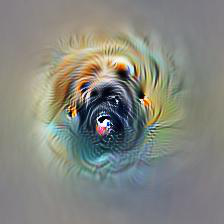

tensor(106.5889)
activation:tensor(26.0625, dtype=torch.float64)
school_bus_4557.JPEG (9, 8)


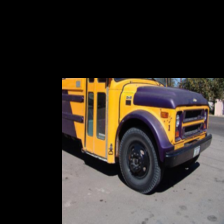

activation:tensor(25.0469, dtype=torch.float64)
ambulance_4867.JPEG (10, 4)


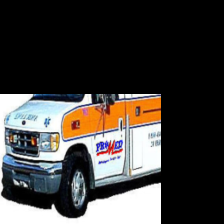

activation:tensor(24.7344, dtype=torch.float64)
pickup_24612.JPEG (9, 3)


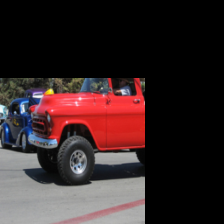

activation:tensor(24.5000, dtype=torch.float64)
school_bus_19678.JPEG (9, 4)


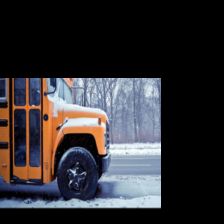

activation:tensor(23.8438, dtype=torch.float64)
tow_truck_3101.JPEG (8, 2)


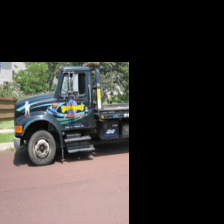

activation:tensor(23.4219, dtype=torch.float64)
school_bus_4350.JPEG (8, 5)


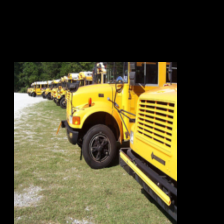

activation:tensor(23.1094, dtype=torch.float64)
racer_37871.JPEG (10, 7)


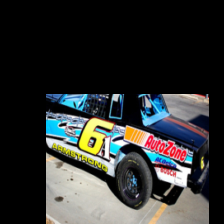

activation:tensor(23.0312, dtype=torch.float64)
ambulance_995.JPEG (11, 7)


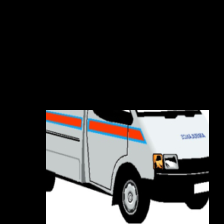

activation:tensor(22.9219, dtype=torch.float64)
police_van_16915.JPEG (9, 5)


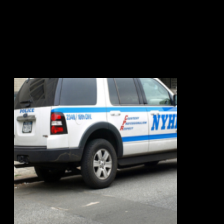

activation:tensor(22.9062, dtype=torch.float64)
ambulance_20347.JPEG (10, 5)


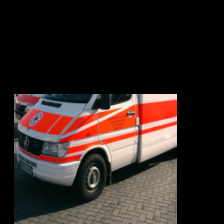

activation:tensor(22.8438, dtype=torch.float64)
police_van_80477.JPEG (9, 8)


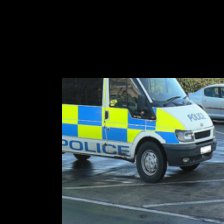

activation:tensor(22.7344, dtype=torch.float64)
police_van_51024.JPEG (10, 6)


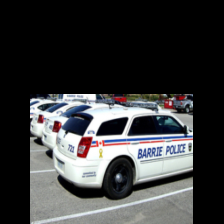

activation:tensor(22.6406, dtype=torch.float64)
cab_24888.JPEG (10, 12)


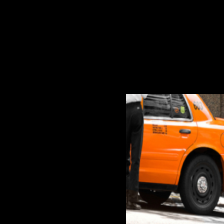

activation:tensor(22.6250, dtype=torch.float64)
fire_engine_18564.JPEG (9, 6)


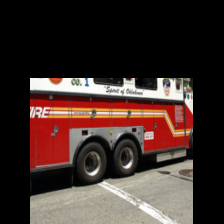

activation:tensor(22.4688, dtype=torch.float64)
bull_mastiff_11447.JPEG (2, 9)


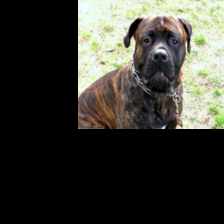

activation:tensor(22.4688, dtype=torch.float64)
go_kart_7185.JPEG (11, 4)


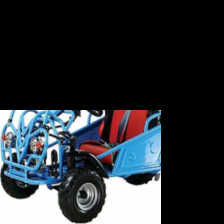

activation:tensor(22.4375, dtype=torch.float64)
moving_van_26659.JPEG (9, 11)


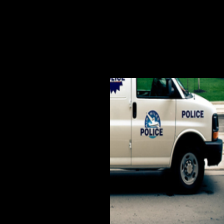

activation:tensor(22.2500, dtype=torch.float64)
moving_van_00032190.JPEG (9, 5)


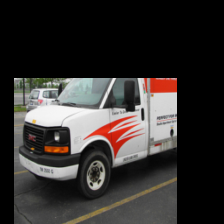

activation:tensor(22.2188, dtype=torch.float64)
ambulance_17381.JPEG (11, 5)


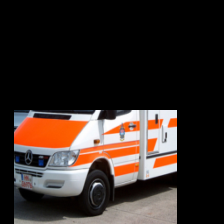

activation:tensor(22.1562, dtype=torch.float64)
harvester_14021.JPEG (8, 8)


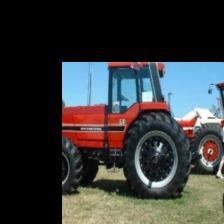

In [13]:
##print top activations from nodeid

#nodeid = 790
#layer_num,unit,layer_full_name = nodeid_2_perlayerid(nodeid,params)

frame = True
num_examples = 20


#model
model = prep_model_params.model
model = model.eval().to(device)



layer_num,unit,layer_full_name = nodeid_2_perlayerid(nodeid,params)
layer = 'conv'+str(layer_num)

select_data_acts = max_activations['layer']['conv'+str(layer_num)][0][:,unit]
select_data_positions = max_activations['layer']['conv'+str(layer_num)][1][:,unit,:]

top_activations = torch.topk(torch.DoubleTensor(select_data_acts),num_examples)

print('UNIT: ' + str(unit))
examples = list(range(num_examples))

print(nodeid)
deepviz_path = '../cnn_subgraph_visualizer/prepped_models/'+prepped_model_folder+'/visualizations/images/neuron/'+str(nodeid)+'.jpg'
deep_image = Image.open(deepviz_path)
display(deep_image)
deep_tensor = preprocess_image(deepviz_path,params)
deep_tensor = deep_tensor.to(device)
activations = {}
output = model(deep_tensor)
print(torch.max(activations[layer][:,unit,:,:]))

for example in range(num_examples):
    print('activation:'+str(top_activations.values[example]))
    image_path = max_activations['image_folder']+'/'+image_names[int(top_activations.indices[example])]
    position = (int(select_data_positions[top_activations.indices[example],0]),int(select_data_positions[top_activations.indices[example],1]))
    print(image_names[int(top_activations.indices[example])],position)
    display_image_patch_for_activation(image_path,layer,position,params,frame=frame)



In [11]:
activations = []

for image in all_ranks[nodeid]:
    activations.append(float(all_ranks[nodeid][image]['activation']))
    

In [12]:
#WARNING! if component edges this could take a long time
 
import plotly.figure_factory as ff
import numpy as np


bin_size = np.std(activations)/10
    
# Create distplot with custom bin_size
fig = ff.create_distplot([activations], group_labels = ['%s activations'%str(nodeid)], bin_size=bin_size)
fig.show()

In [13]:
from scipy.stats import spearmanr, pearsonr

data = {}

features = ['features_0','features_3','features_6','features_8','features_10']


for i,feature in enumerate(features):
    data[feature] = {}
    for img in image_patch_names:
        data[feature][img] = list(all_ranks[nodeid][img]['ranks']['edges']['actxgrad'][i][1].flatten())
       
        
        

        
    
    

In [14]:
import pandas as pd

dataframe = pd.DataFrame(data['features_6'], columns=image_patch_names)
#print("Dataframe is : ")
#print(dataframe)
 
# form correlation matrix
matrix = dataframe.corr()
#print("Correlation matrix is : ")
#print(matrix)

In [15]:
import plotly.express as px

fig = px.imshow(matrix)
fig.show()

In [14]:
#WARNING! if component edges this could take a long time
 
import plotly.figure_factory as ff
import numpy as np


bin_size = np.std(np.array(matrix).flatten())/10
    
# Create distplot with custom bin_size
fig = ff.create_distplot([np.array(matrix).flatten()], group_labels = ['%s correlations'%str(nodeid)], bin_size=bin_size)
fig.show()

NameError: name 'matrix' is not defined

## Circle Scale 

In [1]:
import torch
import pickle
import pandas as pd

root_dir = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/circuit_ranks/alexnet_sparse/bonw_circle_scale_ranks/actxgrad/'
all_ranks = pickle.load(open(root_dir+'node500_noabsoluterank_1644786630.35.pt','rb'))

nodeid = list(all_ranks.keys())[0]
layer_num,unit,layer_full_name = nodeid_2_perlayerid(nodeid,params)
feature_name = layer_full_name+':'+str(unit)
feature_target = {layer_full_name:[unit]}

image_patch_names = list(all_ranks[nodeid].keys())
image_patch_names

circle_data_df = pickle.load(open('/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/image_data/bonw_circle_image_data.pkl','rb'))




NameError: name 'nodeid_2_perlayerid' is not defined

In [3]:
layer_full_name

'features_6'

In [3]:
circle_data_df = pickle.load(open('/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/image_data/bonw_circle_image_data.pkl','rb'))
#circle_data_df.iloc[30:50]
circle_data_df

,diameter,background_r,background_g,background_b,circle_r,circle_g,circle_b
0,460,255,255,255,0,0,0
1,456,255,255,255,0,0,0
2,452,255,255,255,0,0,0
3,448,255,255,255,0,0,0
4,444,255,255,255,0,0,0
...,...,...,...,...,...,...,...
110,20,255,255,255,0,0,0
111,16,255,255,255,0,0,0
112,12,255,255,255,0,0,0
113,8,255,255,255,0,0,0


In [5]:
def get_activation(name):
    def hook(model, input, output):
        activations[name] = output.detach().to('cpu')
    return hook


from PIL import Image
from torchvision import transforms


def display_image_patch_for_activation(image_path,layer_name,position,params,simple_name=True,frame = True, save=False):
    '''
    image_path -> full path to image
    layer_name -> name of reference layer for activation map (can be a layer name based on _ convention or simple 'conv1' convention)
    position -> a tuple (w,h) of position in activation map for which image patch is the receptive field
    simple_name -> set to true if using 'conv1' 'conv2' naming convention, False otherwise
    '''
    if simple_name:
        name_dict = gen_conv_name_dict(model)
        layer_name = name_dict[layer_name]
    recep_field = receptive_field_for_unit(receptive_fields, layer_name, position)
    
    image = Image.open(image_path)
    #display(image)
    resize_2_tensor = transforms.Compose([transforms.Resize((params['deepviz_image_size'],params['deepviz_image_size'])),transforms.ToTensor()])
    tensor_image = resize_2_tensor(image)
    rand_tensor = torch.zeros(3,params['deepviz_image_size'],params['deepviz_image_size'])
    cropped_tensor_image = tensor_image[:,int(recep_field[0][0]):int(recep_field[0][1]),int(recep_field[1][0]):int(recep_field[1][1])]
    rand_tensor[:,int(recep_field[0][0]):int(recep_field[0][1]),int(recep_field[1][0]):int(recep_field[1][1])] = cropped_tensor_image
    if frame:
        cropped_image = transforms.ToPILImage()(rand_tensor).convert("RGB")
    else:    
        cropped_image = transforms.ToPILImage()(cropped_tensor_image).convert("RGB")
    
    if save:
        cropped_image.save(save)
    else:
        display(cropped_image)
    
 

def run_cropped_image_patch_for_activation(model,image_path,layer_name,within_layer_id,position,params,simple_name=True):
    '''
    image_path -> full path to image
    layer_name -> name of reference layer for activation map (can be a layer name based on _ convention or simple 'conv1' convention)
    position -> a tuple (w,h) of position in activation map for which image patch is the receptive field
    simple_name -> set to true if using 'conv1' 'conv2' naming convention, False otherwise
    '''
    if simple_name:
        name_dict = gen_conv_name_dict(model)
        layer_name = name_dict[layer_name]
    recep_field = receptive_field_for_unit(receptive_fields, layer_name, position)

 
    tensor_image = preprocess_image(image_path,params)
    rand_tensor = torch.zeros(1,3,params['deepviz_image_size'],params['deepviz_image_size'])
    cropped_tensor_image = tensor_image[:,:,int(recep_field[0][0]):int(recep_field[0][1]),int(recep_field[1][0]):int(recep_field[1][1])]
    rand_tensor[:,:,int(recep_field[0][0]):int(recep_field[0][1]),int(recep_field[1][0]):int(recep_field[1][1])] = cropped_tensor_image
    rand_tensor = rand_tensor.to(params['device'])
    output = model(rand_tensor)





count = 0
for layer in model.modules():
    if isinstance(layer, nn.Conv2d):
        layer.register_forward_hook(get_activation('conv'+str(count)))
        #max_activations['layer']['conv'+str(count)] = {}
        count+=1

      
        


image_names = os.listdir(max_activations['image_folder'])
image_names.sort()

UNIT: 28
284


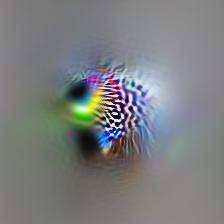

tensor(91.3094)
activation:tensor(39.0938, dtype=torch.float64)
electric_fan_25450.JPEG (10, 10)


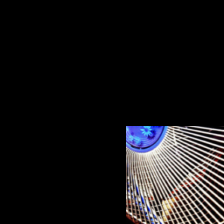

activation:tensor(37.8438, dtype=torch.float64)
sock_10352.JPEG (5, 4)


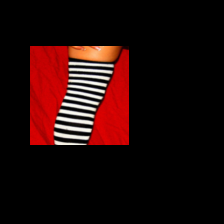

activation:tensor(36.5625, dtype=torch.float64)
iron_38496.JPEG (3, 6)


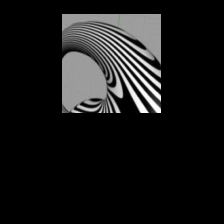

activation:tensor(35.4062, dtype=torch.float64)
loudspeaker_68026.JPEG (11, 4)


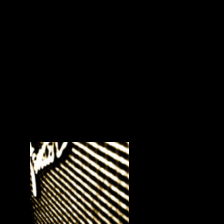

activation:tensor(34.3438, dtype=torch.float64)
window_screen_271.JPEG (9, 2)


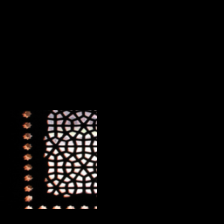

activation:tensor(34.1250, dtype=torch.float64)
window_shade_30182.JPEG (6, 4)


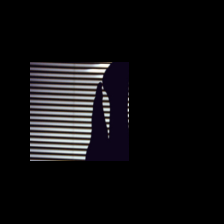

activation:tensor(33.9688, dtype=torch.float64)
space_heater_870.JPEG (6, 3)


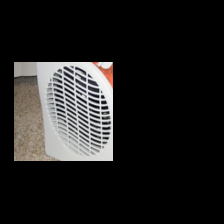

activation:tensor(33.7188, dtype=torch.float64)
microphone_23608.JPEG (3, 2)


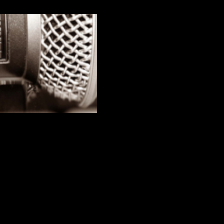

activation:tensor(33.6562, dtype=torch.float64)
grille_15880.JPEG (10, 6)


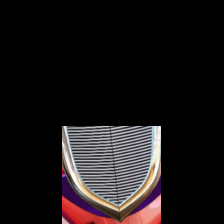

activation:tensor(33.5312, dtype=torch.float64)
umbrella_9913.JPEG (10, 5)


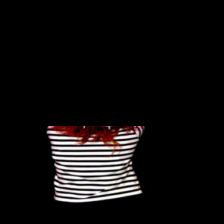

activation:tensor(33.1562, dtype=torch.float64)
radiator_7930.JPEG (7, 6)


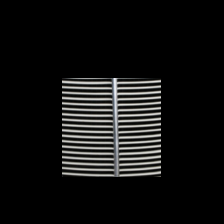

activation:tensor(32.9688, dtype=torch.float64)
pillow_68.JPEG (5, 3)


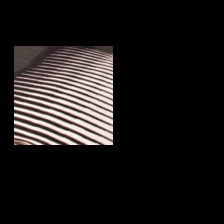

activation:tensor(32.5000, dtype=torch.float64)
window_shade_5405.JPEG (10, 4)


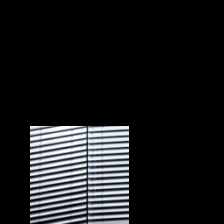

activation:tensor(32.4062, dtype=torch.float64)
window_shade_6481.JPEG (2, 1)


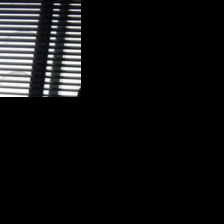

activation:tensor(32.4062, dtype=torch.float64)
space_heater_4795.JPEG (3, 2)


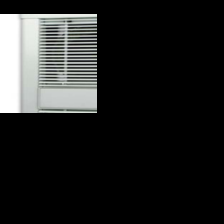

activation:tensor(32.2812, dtype=torch.float64)
Indian_cobra_00022819.JPEG (6, 2)


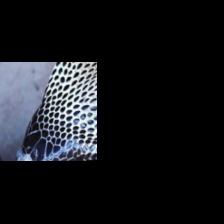

activation:tensor(32.0938, dtype=torch.float64)
grille_18911.JPEG (9, 3)


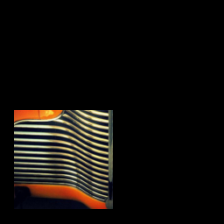

activation:tensor(31.7500, dtype=torch.float64)
window_shade_20396.JPEG (4, 5)


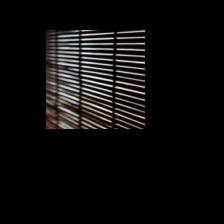

activation:tensor(31.7031, dtype=torch.float64)
umbrella_18098.JPEG (4, 3)


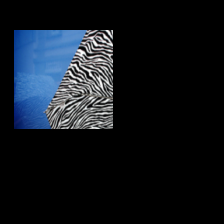

activation:tensor(31.6250, dtype=torch.float64)
strainer_32767.JPEG (8, 7)


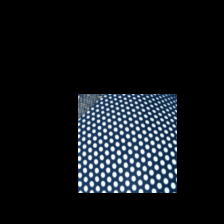

activation:tensor(31.4844, dtype=torch.float64)
electric_fan_3244.JPEG (10, 8)


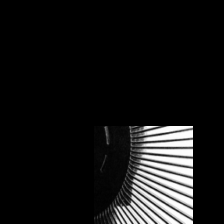

activation:tensor(31.3125, dtype=torch.float64)
grille_17779.JPEG (4, 7)


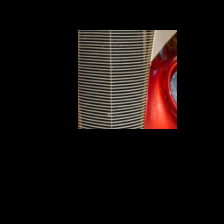

activation:tensor(31., dtype=torch.float64)
electric_fan_11938.JPEG (2, 6)


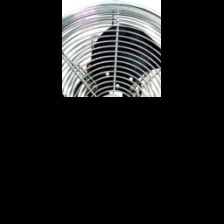

activation:tensor(30.8906, dtype=torch.float64)
coffee_mug_4085.JPEG (6, 5)


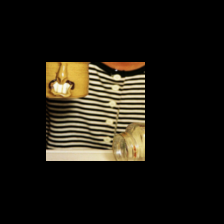

activation:tensor(30.6562, dtype=torch.float64)
vacuum_26649.JPEG (8, 4)


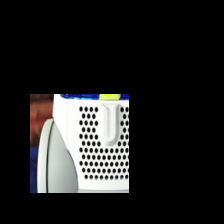

activation:tensor(30.3594, dtype=torch.float64)
space_heater_653.JPEG (9, 1)


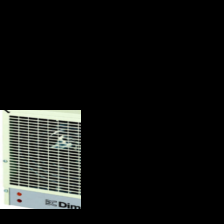

activation:tensor(30.2656, dtype=torch.float64)
window_shade_14465.JPEG (6, 1)


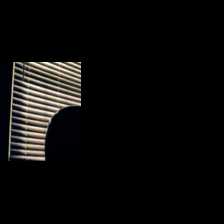

activation:tensor(30.1875, dtype=torch.float64)
solar_dish_5172.JPEG (4, 10)


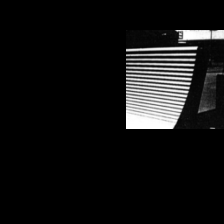

activation:tensor(29.8750, dtype=torch.float64)
window_shade_2112.JPEG (2, 8)


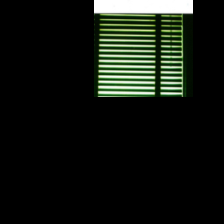

activation:tensor(29.8281, dtype=torch.float64)
grille_4402.JPEG (8, 5)


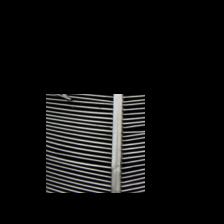

activation:tensor(29.7344, dtype=torch.float64)
matchstick_25300.JPEG (1, 5)


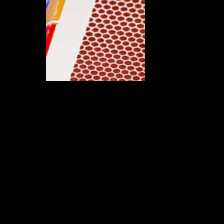

activation:tensor(29.6562, dtype=torch.float64)
zebra_2930.JPEG (8, 1)


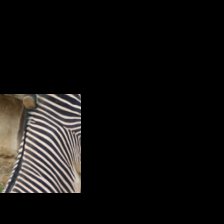

activation:tensor(29.5938, dtype=torch.float64)
maraca_12258.JPEG (10, 8)


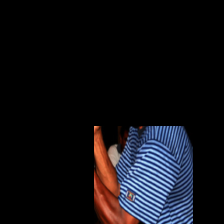

activation:tensor(29.4062, dtype=torch.float64)
modem_1442.JPEG (11, 1)


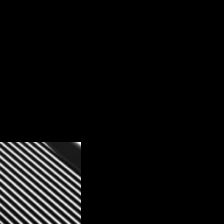

activation:tensor(29.3906, dtype=torch.float64)
upright_24664.JPEG (4, 5)


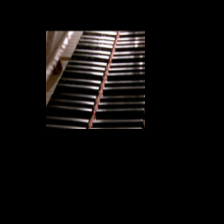

activation:tensor(29.3125, dtype=torch.float64)
space_heater_2197.JPEG (4, 5)


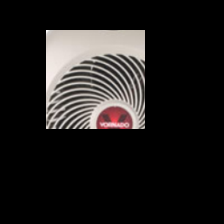

activation:tensor(29.2344, dtype=torch.float64)
stole_27.JPEG (8, 5)


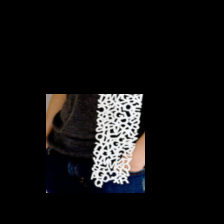

activation:tensor(28.9688, dtype=torch.float64)
microphone_8983.JPEG (4, 10)


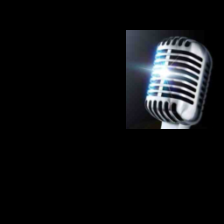

activation:tensor(28.9531, dtype=torch.float64)
window_shade_13993.JPEG (7, 7)


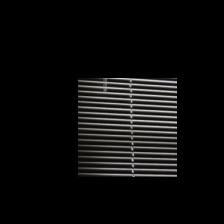

activation:tensor(28.8438, dtype=torch.float64)
space_heater_1429.JPEG (3, 5)


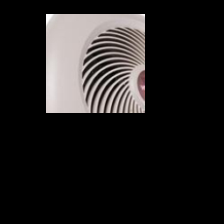

In [16]:
#print top activations from nodeid

nodeid = 284
layer_num,unit,layer_full_name = nodeid_2_perlayerid(nodeid,params)





frame = True
num_examples = 40


#model
model = prep_model_params.model
model = model.eval().to(device)



layer_num,unit,layer_full_name = nodeid_2_perlayerid(nodeid,params)
layer = 'conv'+str(layer_num)

select_data_acts = max_activations['layer']['conv'+str(layer_num)][0][:,unit]
select_data_positions = max_activations['layer']['conv'+str(layer_num)][1][:,unit,:]

top_activations = torch.topk(torch.DoubleTensor(select_data_acts),num_examples)

print('UNIT: ' + str(unit))
examples = list(range(num_examples))

print(nodeid)
deepviz_path = '../cnn_subgraph_visualizer/prepped_models/'+prepped_model_folder+'/visualizations/images/neuron/'+str(nodeid)+'.jpg'
deep_image = Image.open(deepviz_path)
display(deep_image)
deep_tensor = preprocess_image(deepviz_path,params)
deep_tensor = deep_tensor.to(device)
activations = {}
output = model(deep_tensor)
print(torch.max(activations[layer][:,unit,:,:]))

for example in range(num_examples):
    print('activation:'+str(top_activations.values[example]))
    image_path = max_activations['image_folder']+'/'+image_names[int(top_activations.indices[example])]
    position = (int(select_data_positions[top_activations.indices[example],0]),int(select_data_positions[top_activations.indices[example],1]))
    print(image_names[int(top_activations.indices[example])],position)
    display_image_patch_for_activation(image_path,layer,position,params,frame=frame)



In [175]:
sorted_image_names = [str(x)+'.jpg' for x in list(circle_data_df.sort_values(by=['diameter']).index)]

orig_activations = []
sizes = []

for image in sorted_image_names:
    orig_activations.append(float(all_ranks[nodeid][image]['activation']))
    sizes.append(int(circle_data_df.loc[int(image.replace('.jpg',''))]['diameter']))
 
# import plotly.figure_factory as ff
# import numpy as np


# bin_size = np.std(activations)/10
    
# # Create distplot with custom bin_size
# fig = ff.create_distplot([activations], group_labels = ['%s activations'%str(nodeid)], bin_size=bin_size)
# fig.show()

In [176]:
#sizes versus activation


# x and y given as array_like objects
import plotly.express as px

fig = px.line(x=sizes, y=orig_activations,)

fig.update_layout({
                    'plot_bgcolor':'rgba(0,0,0,0)',
                    'paper_bgcolor':'rgba(0,0,0,0)'
                    })
fig.update_xaxes(title="Circle Diameter")
fig.update_yaxes(title="Activation")
fig.show()

In [177]:
from scipy.stats import spearmanr, pearsonr


data = {}

features = ['features_0','features_3','features_6','features_8','features_10']

sorted_image_names = [str(x)+'.jpg' for x in list(circle_data_df.sort_values(by=['diameter']).index)]


for i,feature in enumerate(features):
    data[feature] = {}
    for img in sorted_image_names:
        if feature != layer_full_name:
            data[feature][img] = list(all_ranks[nodeid][img]['ranks']['edges']['actxgrad'][i][1].flatten())
        else:
            data[feature][img] = list(all_ranks[nodeid][img]['ranks']['edges']['actxgrad'][i][1][unit,:].flatten())
        

In [194]:
dataframe = pd.DataFrame(data['features_6'], columns=sorted_image_names)
#print("Dataframe is : ")
#print(dataframe)
 
# form correlation matrix
matrix = dataframe.corr(method='spearman')
#print("Correlation matrix is : ")
#print(matrix)

In [195]:
import plotly.express as px

fig = px.imshow(matrix)
fig.show()

#### extract big and small circle circuits

In [225]:
#averaging ranks
ranktype = 'actxgrad'


#big = range(30,40)
#small = range(100,110)

small = range(104,105)         #these sizes are activation matched (66) and have diameters 44 and 244 FOR unit445
big = range(54,55)


small = range(96,97)         #these sizes are activation matched (24) and have diameters 76 and 296 FOR unit500
big = range(41,42)
#small = range(110,111)         #these sizes are activation matched (17) and have diameters 20 and 340 
#big = range(30,31)


big_avg_ranks = {'ranks':{'edges':{ranktype:all_ranks[nodeid][str(big[0])+'.jpg']['ranks']['edges'][ranktype]}}}
small_avg_ranks = {'ranks':{'edges':{ranktype:all_ranks[nodeid][str(small[0])+'.jpg']['ranks']['edges'][ranktype]}}}

for i in big[1:]:
    for j in range(len(all_ranks[nodeid][str(i)+'.jpg']['ranks']['edges'][ranktype])):
        big_avg_ranks['ranks']['edges'][ranktype][j][1] += all_ranks[nodeid][str(i)+'.jpg']['ranks']['edges'][ranktype][j][1]
 
for j in range(len(big_avg_ranks['ranks']['edges'][ranktype])):
    big_avg_ranks['ranks']['edges'][ranktype][j][1] /= len(big)

for i in small[1:]:
    for j in range(len(all_ranks[nodeid][str(i)+'.jpg']['ranks']['edges'][ranktype])):
        small_avg_ranks['ranks']['edges'][ranktype][j][1] += all_ranks[nodeid][str(i)+'.jpg']['ranks']['edges'][ranktype][j][1]

for j in range(len(small_avg_ranks['ranks']['edges'][ranktype])):
    small_avg_ranks['ranks']['edges'][ranktype][j][1] /= len(small)
        
        
        
diff_small_ranks = {'ranks':{'edges':{ranktype:deepcopy(small_avg_ranks['ranks']['edges'][ranktype])}}}

for i,l in enumerate(diff_small_ranks['ranks']['edges'][ranktype]):
    l[1] -= big_avg_ranks['ranks']['edges'][ranktype][i][1]
    print(l[1])
    
diff_big_ranks = {'ranks':{'edges':{ranktype:deepcopy(big_avg_ranks['ranks']['edges'][ranktype])}}}

for i,l in enumerate(diff_big_ranks['ranks']['edges'][ranktype]):
    l[1] -= small_avg_ranks['ranks']['edges'][ranktype][i][1]
    #print(l[1])





del model
config = load_config('/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/configs/alexnet_sparse_config.py')
model = deepcopy(config.model)
model = model.to(device).eval()

    
big_circle_circuit_model, big_circle_circuit_mask = model_ranks_2_circuit_model(big_avg_ranks,.03,model,feature_target,device,method=ranktype)

small_circle_circuit_model, small_circle_circuit_mask = model_ranks_2_circuit_model(small_avg_ranks,.03,model,feature_target,device,method=ranktype)

diff_small_model, diff_small_mask = model_ranks_2_circuit_model(diff_small_ranks,.03,model,feature_target,device,method=ranktype)

diff_big_model, diff_big_mask = model_ranks_2_circuit_model(diff_big_ranks,.03,model,feature_target,device,method=ranktype)

[[-2.9373e-04  4.9162e-04  1.5271e-04]
 [ 7.9274e-06  1.6248e-04  2.0778e-04]
 [ 1.9741e-03 -1.1272e-03 -9.5558e-04]
 [ 3.6418e-05 -2.8133e-05 -2.0027e-05]
 [-1.6260e-04 -2.5034e-06  1.3447e-04]
 [ 1.8322e-04  4.9305e-04  3.0875e-04]
 [ 3.4451e-05 -3.6716e-05 -7.6294e-06]
 [-2.3198e-04 -6.9737e-06 -4.1842e-05]
 [ 1.0765e-04 -5.0724e-05 -2.9564e-05]
 [-6.0141e-05 -4.9531e-05 -2.6286e-05]
 [-3.4761e-04 -4.2510e-04 -1.8370e-04]
 [ 5.8174e-04  3.7718e-04  5.4300e-05]
 [-1.0729e-05  4.1962e-05 -6.9737e-06]
 [ 3.8505e-05  6.2704e-05 -2.7537e-05]
 [-8.7786e-04 -8.7929e-04 -7.7486e-05]
 [-3.6895e-05 -4.2975e-05  4.8816e-05]
 [ 3.3855e-04  4.6515e-04  2.4033e-04]
 [-1.1325e-04 -5.3823e-05 -6.1393e-06]
 [ 7.2122e-05  2.7537e-04  2.1541e-04]
 [-1.5700e-04 -4.6551e-05  4.8816e-05]
 [ 9.6989e-04 -1.4029e-03  5.5313e-04]
 [ 1.1435e-03 -2.1076e-03  9.8801e-04]
 [-5.3108e-05 -1.1528e-04 -4.0889e-05]
 [-2.9802e-07  1.1754e-04 -6.2883e-05]
 [-1.8787e-04 -2.9969e-04 -2.2519e-04]
 [ 1.4591e-04  1.7953e-04

In [226]:
def mask_intersect_over_union(mask1,mask2):
    union_mask = []
    for i in range(len(mask1)):
        intersect_mask = mask1[i]*mask2[i]
        union_mask = torch.ceil((mask1[i]+mask2[i])/2)
        print(torch.sum(intersect_mask)/torch.sum(union_mask))
    





In [227]:
mask_intersect_over_union(small_circle_circuit_mask,big_circle_circuit_mask)

tensor(0.3200)
tensor(0.1015)
tensor(0.3947)


In [228]:
mask_intersect_over_union(diff_small_mask,diff_big_mask)

tensor(0.)
tensor(0.)
tensor(0.)


#### visualize small and big circle circuit

100%|██████████| 512/512 [00:05<00:00, 91.45it/s]



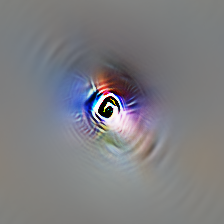

In [229]:
from lucent_fresh.optvis import render, param, transform, objectives
from lucent_fresh.modelzoo.util import get_model_layers


small_circle_circuit_model = small_circle_circuit_model.to(device).eval()
param_f = lambda: param.image(224)
obj  = objectives.neuron('features_6',0)
_ = render.render_vis(small_circle_circuit_model,  obj, param_f, transforms=None, show_inline=True)

100%|██████████| 512/512 [00:05<00:00, 90.95it/s]



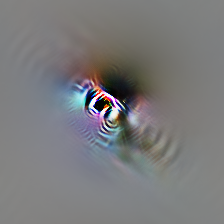

In [231]:

diff_small_model = diff_small_model.to(device).eval()
param_f = lambda: param.image(224)
obj  = objectives.neuron('features_6',0)
_ = render.render_vis(diff_small_model,  obj, param_f, transforms=None, show_inline=True)

100%|██████████| 512/512 [00:05<00:00, 93.02it/s]



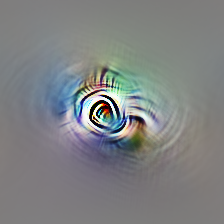

In [220]:
all_transforms = [
    transform.pad(4),
    transform.jitter(2),
    transform.random_scale([n/100. for n in range(95, 105)]),
    transform.random_rotate(list(range(-10,10)) + list(range(-5,5)) + 10*list(range(-2,2))),
    transform.jitter(2),
]


big_circle_circuit_model = big_circle_circuit_model.to(device).eval()
param_f = lambda: param.image(224,)
obj  = objectives.neuron('features_6',0)
_ = render.render_vis(big_circle_circuit_model, obj, param_f, transforms=None, show_inline=True, thresholds=(512,))

100%|██████████| 512/512 [00:05<00:00, 90.85it/s]



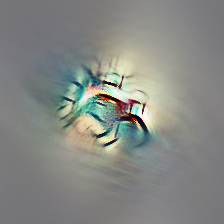

In [232]:

diff_big_model = diff_big_model.to(device).eval()
param_f = lambda: param.image(224)
obj  = objectives.neuron('features_6',0)
_ = render.render_vis(diff_big_model,  obj, param_f, transforms=all_transforms, show_inline=True)

In [210]:
#batch_param_f = lambda: param.image(224, batch=4)
#obj = objectives.channel("features_8", 53) - 1e2 * objectives.diversity("features_8")
#_ = render.render_vis(dissected_model, obj, batch_param_f, show_inline=True)

param_f = lambda: param.image(224)
obj  = objectives.neuron('features_6',189)
_ = render.render_vis(dissected_model,  obj, param_f, transforms=None, show_inline=True)

  0%|          | 0/512 [00:00<?, ?it/s]


IndexError: index 189 is out of bounds for dimension 1 with size 1

##### get activations from circuit models

In [222]:
layer_num

2

In [233]:
from torchvision import transforms


circuits_activations = []

for circuit in [small_circle_circuit_model,big_circle_circuit_model,diff_small_model,diff_big_model]:
    
    circuit_activations = []

    dissected_model = dissect_model(circuit, store_ranks = False, store_activations=True, clear_ranks = True, device=device)
    dissected_model = dissected_model.to(device)


    kwargs = {'num_workers': config.num_workers, 'pin_memory': True, 'sampler' : None} if 'cuda' in device else {}

    image_root = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/image_data/bonw_circles/'

    receptive_fields = None
    if os.path.exists('../cnn_subgraph_visualizer/prepped_models/%s/receptive_fields.pkl'%prepped_model_folder):
        receptive_fields = pickle.load(open('../cnn_subgraph_visualizer/prepped_models/%s/receptive_fields.pkl'%prepped_model_folder,'rb'))


    from time import time
    import pickle

    #circle like images

    #layer_num,unit,layer_full_name = 3,0,'features_8'
    feature_name = layer_full_name+':'+str(0)
    feature_target = {layer_full_name:[0]}

    position1 = 5
    position2 = 5

    recep_field = receptive_field_for_unit(receptive_fields, layer_full_name, (position1,position2))



    start = time()

    ranks_slow = {nodeid:{}}

    print(nodeid)
    print(feature_name)
    #print(feature_to_conv_dict[layer_full_name])

    image_names = os.listdir(image_root)
    image_names.sort()

    sorted_image_names = [str(x)+'.jpg' for x in list(circle_data_df.sort_values(by=['diameter']).index)]

    small_activations = []

    for i, image_name in enumerate(sorted_image_names):
        #if int(image_name.replace('.jpg','')) < 100:
        #	continue

        image_path = image_root+image_name
        image = Image.open(image_path)

        resize_2_tensor = transforms.Compose([transforms.Resize((int(recep_field[0][1]-recep_field[0][0]),int(recep_field[1][1]-recep_field[1][0]))),transforms.ToTensor()])
        tensor_image = resize_2_tensor(image)
        in_tensor = torch.zeros(3,params['deepviz_image_size'],params['deepviz_image_size'])
        in_tensor[:,int(recep_field[0][0]):int(recep_field[0][1]),int(recep_field[1][0]):int(recep_field[1][1])] = tensor_image

        norm = transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])

        in_tensor = norm(in_tensor)
        in_tensor = torch.unsqueeze(in_tensor,0)
        in_tensor = in_tensor.to(device)

        dissected_model.zero_grad()
        set_across_model(dissected_model,'rank_field',[[position1,position2]])

        #Run model forward until all targets reached

        outputs = dissected_model(in_tensor)


        circuit_activations.append(float(dissected_model.features_6.postbias_out[0,0,position1,position2].cpu().detach().numpy().astype('float32')))

    circuits_activations.append(circuit_activations)



500
features_6:0
500
features_6:0
500
features_6:0
500
features_6:0


In [234]:
#sizes versus activation

sizes
df_list = []

column_names = ['diameter','activation','model']
for i,size in enumerate(sizes):
    row = [size,orig_activations[i],'original model']
    df_list.append(row)
    row = [size,circuits_activations[0][i],'small model']
    df_list.append(row)
    row = [size,circuits_activations[1][i],'big model']
    df_list.append(row)
    row = [size,circuits_activations[2][i],'diff small model']
    df_list.append(row)
    row = [size,circuits_activations[3][i],'diff big model']
    df_list.append(row)


    
act_df = pd.DataFrame(df_list,columns=column_names)

# x and y given as array_like objects
import plotly.express as px

fig = px.line(act_df,x='diameter', y='activation',color='model',
              color_discrete_map={
                                 "original model": "#7371de",
                                 "small model": "#de7171",
                                 "big model": "#71de7a",
                                 "diff small model": "#deb471",
                                 "diff big model": "#71dea8",})

fig.update_layout({
                    'plot_bgcolor':'rgba(255,255,255,1)',
                    'paper_bgcolor':'rgba(255,255,255,1)'
                    })

fig.update_traces(line=dict(width=5))

fig.update_xaxes(title="Circle Diameter",zeroline=True,zerolinecolor='black')
fig.update_yaxes(title="Activation",zeroline=True,zerolinecolor='black')
fig.show()

In [ ]:
neg_big_ranks = {'ranks':{'edges':{ranktype:deepcopy(big_avg_ranks['ranks']['edges'][ranktype])}}}

for i,l in enumerate(neg_big_ranks['ranks']['edges'][ranktype]):
    l[1] *= -1
    print(l[1])
    

del model
config = load_config('/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/configs/alexnet_sparse_config.py')
model = deepcopy(config.model)
model = model.to(device).eval()


neg_big_model, neg_big_mask = model_ranks_2_circuit_model(neg_big_ranks,.05,model,feature_target,device,method=ranktype)

100%|██████████| 512/512 [00:05<00:00, 99.54it/s] 



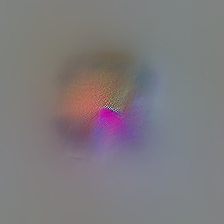

In [18]:

neg_big_model = neg_big_model.to(device).eval()
param_f = lambda: param.image(224)
obj  = objectives.neuron('features_6',0)
_ = render.render_vis(neg_big_model,  obj, param_f, transforms=None, show_inline=True)

##### update circle rankss with small   

In [24]:
ranks_folder = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/circuit_ranks/alexnet_sparse/bonw_circle_scale_ranks/actxgrad/'
small_ranks = pickle.load(open(ranks_folder+'node445_small_1644733451.23.pt','rb'))
other_ranks = pickle.load(open(ranks_folder+'node445_1644526377.43.pt','rb'))

In [30]:
other_ranks[445].update(small_ranks[445])

In [35]:
pickle.dump(other_ranks,open(ranks_folder+'node445.pkl','wb'))

In [38]:
unit

0

#### crop visualizations

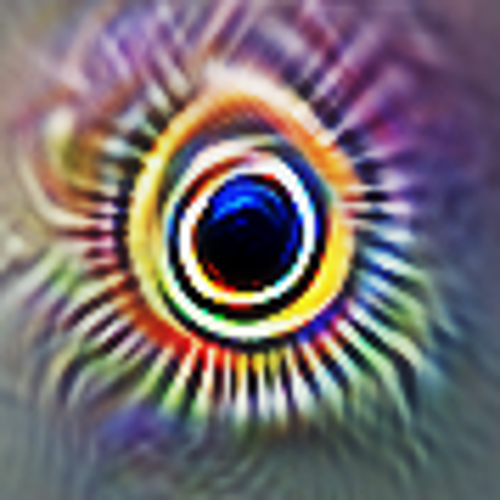

In [27]:
from PIL import Image

viz_folder= '/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/image_data/scaling_circle_visualizations/'

# Opens a image in RGB mode
im = Image.open(viz_folder+'445.png')

im = im.convert('RGB')
# Size of the image in pixels (size of original image)
# (This is not mandatory)
width, height = im.size
 
# Setting the points for cropped image
left = width/3 -7
right = 2*width/3 +8
top = height / 3 -7
bottom = 2 * height / 3 +8
 
# Cropped image of above dimension
# (It will not change original image)
im1 = im.crop((left, top, right, bottom))
 
# Shows the image in image viewer
im1 = im1.resize((500,500))

im1